# Unsupervised Machine Learning Workshop
## Juan José Hoyos Urcué

In [1]:
#Aquí se cargan las librerías y se hace la lectura del archivo que contiene la base de datos 
import numpy as np
import pandas as pd
import sklearn as sk
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing


data = pd.read_csv("household_power_consumption.txt", header=None, na_values="?", sep=";",low_memory = False)
data = data.drop(data.index[0])
data.columns = ['Date','Time','Global_active_power','Global_reactive_power','Voltage','Global_intensity','Sub_metering_1',
                'Sub_metering_2','Sub_metering_3']



In [2]:
#Se reducen los datos lo menos posible para que no obtengamos error por limitacion de memoria
#En mi caso la cantidad de registors en los que no se obtiene el error es : 29259
#Dicha cantidad es utilizada en una máquina con 12GB de RAM
np.random.seed(10)
remove_n = 2046000 #valor requerido a eliminar de todo el dataset para obtener finalmente 29259 registros
drop_indices = np.random.choice(data.index, remove_n, replace=False)
data = data.drop(drop_indices)

#Convertir todos los numericos(que están en tipo object) a su respectivo flotante
float_atr = ['Global_active_power','Global_reactive_power','Voltage','Global_intensity','Sub_metering_1',
                'Sub_metering_2','Sub_metering_3']

for i in float_atr:
    data[i] = data[i].astype('float64')
    
#Conjunto de datos a utilizar en todo el taller
data

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
25,16/12/2006,17:48:00,4.474,0.000,234.96,19.4,0.0,0.0,17.0
107,16/12/2006,19:10:00,3.400,0.000,234.28,14.4,0.0,1.0,17.0
171,16/12/2006,20:14:00,3.388,0.140,233.26,14.4,0.0,0.0,16.0
346,16/12/2006,23:09:00,0.852,0.000,241.64,5.2,0.0,0.0,0.0
628,17/12/2006,03:51:00,0.412,0.000,246.54,3.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
2074999,26/11/2010,16:42:00,1.086,0.268,240.33,4.6,0.0,1.0,0.0
2075072,26/11/2010,17:55:00,1.044,0.136,237.18,4.4,0.0,0.0,0.0
2075107,26/11/2010,18:30:00,1.822,0.000,238.38,7.6,0.0,0.0,0.0
2075173,26/11/2010,19:36:00,1.786,0.070,234.25,7.6,0.0,0.0,0.0


In [3]:
#En el primer elemento de la tupla podemos apreciar la cantidad de registros que tiene la base de datos
#En el segundo elemento de la tupla podemos apreciar la cantidad de atributos que tiene la base de datos
shape = data.shape
shape

(29259, 9)

In [4]:
#Aquí podemos apreciar el tipo de cada uno de los atributos
data. dtypes

Date                      object
Time                      object
Global_active_power      float64
Global_reactive_power    float64
Voltage                  float64
Global_intensity         float64
Sub_metering_1           float64
Sub_metering_2           float64
Sub_metering_3           float64
dtype: object

In [5]:
#Medidas de centralidad y desviación para atributos numéricos:
data.describe()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
count,28877.000000,28877.000000,28877.000000,28877.000000,28877.000000,28877.000000,28877.000000
mean,1.105039,0.124862,240.817671,4.686726,1.181632,1.326835,6.512380
std,1.074730,0.113300,3.241364,4.518438,6.318596,5.875908,8.468971
min,0.076000,0.000000,225.470000,0.200000,0.000000,0.000000,0.000000
25%,0.310000,0.048000,238.940000,1.400000,0.000000,0.000000,0.000000
50%,0.610000,0.102000,240.990000,2.800000,0.000000,0.000000,1.000000
75%,1.540000,0.196000,242.860000,6.400000,0.000000,1.000000,17.000000
max,9.132000,0.986000,252.830000,39.400000,79.000000,77.000000,31.000000


In [6]:
#sacamos la moda de los atributos
data.mode()

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,23/11/2007,17:39:00,0.322,0.0,241.27,1.0,0.0,0.0,0.0
1,8/2/2007,21:26:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN


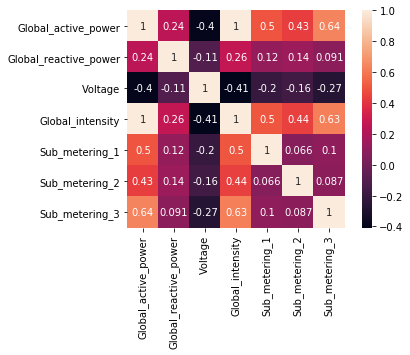

In [7]:
#Aquí podemos apreciar la matriz de correlación de una manera más gráfica
sns.heatmap(data.corr(), square=True, annot=True)

borre Global_intensity


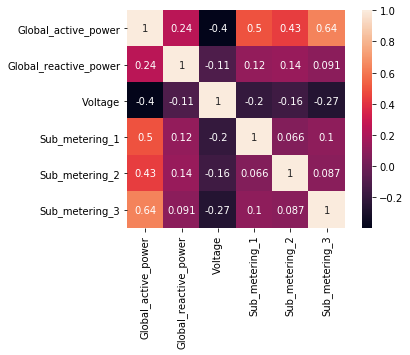

In [8]:
#borramos los atributos cuya correlacion es mayor a 0.8
def correlation(dataset, threshold):
    col_corr = set() # Set of all the names of deleted columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j] >= threshold) and (corr_matrix.columns[j] not in col_corr):
                colname = corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
                if colname in dataset.columns:
                    del dataset[colname] # deleting the column from the dataset
                    print("borre "+colname)

    return dataset
data = correlation(data,0.8)
sns.heatmap(data.corr(), square=True, annot=True)

In [9]:
# Cual es el máximo de datos faltantes en un mismo registro?
max(data.isnull().sum(axis=1))

6

In [10]:
#Cuantos datos faltantes hay por cada atributo?
data.isnull().sum()

Date                       0
Time                       0
Global_active_power      382
Global_reactive_power    382
Voltage                  382
Sub_metering_1           382
Sub_metering_2           382
Sub_metering_3           382
dtype: int64

In [11]:
#Reemplazar los datos faltantes por la media
data.Global_active_power.fillna(data.Global_active_power.mean(), inplace=True)
data.Global_reactive_power.fillna(data.Global_reactive_power.mean(), inplace=True)
data.Voltage.fillna(data.Voltage.mean(), inplace=True)
data.Sub_metering_1.fillna(data.Sub_metering_1.mean(), inplace=True)
data.Sub_metering_2.fillna(data.Sub_metering_2.mean(), inplace=True)
data.Sub_metering_3.fillna(data.Sub_metering_3.mean(), inplace=True)
data
data.isnull().sum()

Date                     0
Time                     0
Global_active_power      0
Global_reactive_power    0
Voltage                  0
Sub_metering_1           0
Sub_metering_2           0
Sub_metering_3           0
dtype: int64

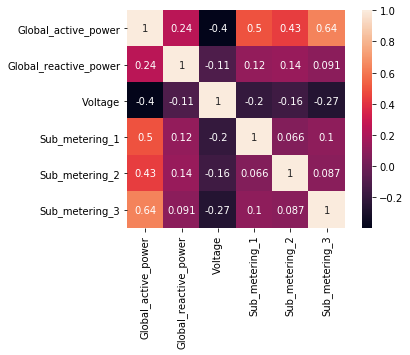

In [12]:
#Aquí podemos apreciar la matriz de correlación de una manera más gráfica
sns.heatmap(data.corr(), square=True, annot=True)

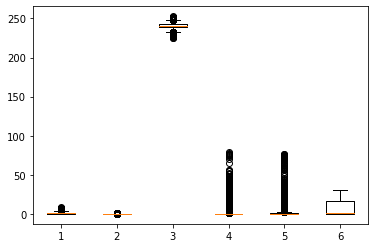

In [13]:
#Generar los diagramas de cajas y bigotes
plt.boxplot((data['Global_active_power'],data['Global_reactive_power'],data['Voltage'],data['Sub_metering_1'],data['Sub_metering_2'], data['Sub_metering_3']))
plt.show()

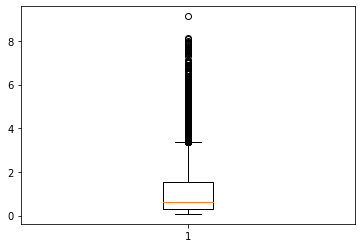

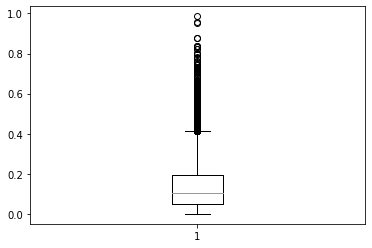

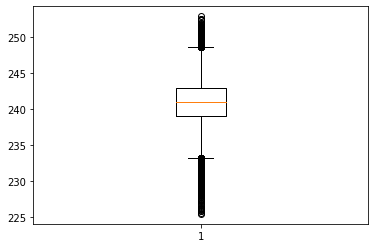

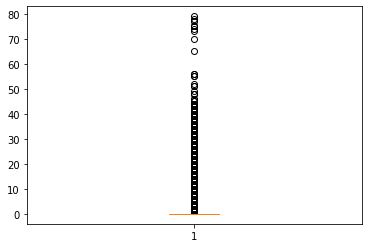

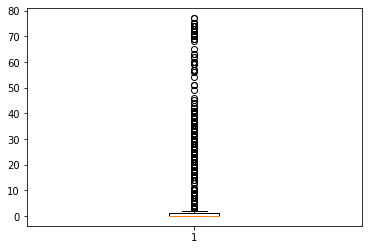

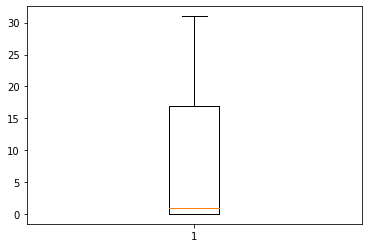

In [14]:
#En qué atributos hay datos atípicos?
plt.boxplot(data['Global_active_power'])
plt.show()
plt.boxplot(data['Global_reactive_power'])
plt.show()
plt.boxplot(data['Voltage'])
plt.show()
plt.boxplot(data['Sub_metering_1'])
plt.show()
plt.boxplot(data['Sub_metering_2'])
plt.show()
plt.boxplot(data['Sub_metering_3'])
plt.show()

#### Se separa la columna Date en day-month-year
#### Igualmente la columna Time en hours-minutes

In [15]:
data['day'] = pd.DatetimeIndex(data['Date']).day
data['month'] = pd.DatetimeIndex(data['Date']).month
data['year'] = pd.DatetimeIndex(data['Date']).year
data['hours'] = pd.DatetimeIndex(data['Time']).hour
data['minutes'] = pd.DatetimeIndex(data['Time']).minute
data = data.drop('Date', 1)
data = data.drop('Time', 1)
data

,Global_active_power,Global_reactive_power,Voltage,Sub_metering_1,Sub_metering_2,Sub_metering_3,day,month,year,hours,minutes
25,4.474,0.000,234.96,0.0,0.0,17.0,16,12,2006,17,48
107,3.400,0.000,234.28,0.0,1.0,17.0,16,12,2006,19,10
171,3.388,0.140,233.26,0.0,0.0,16.0,16,12,2006,20,14
346,0.852,0.000,241.64,0.0,0.0,0.0,16,12,2006,23,9
628,0.412,0.000,246.54,0.0,0.0,0.0,17,12,2006,3,51
...,...,...,...,...,...,...,...,...,...,...,...
2074999,1.086,0.268,240.33,0.0,1.0,0.0,26,11,2010,16,42
2075072,1.044,0.136,237.18,0.0,0.0,0.0,26,11,2010,17,55
2075107,1.822,0.000,238.38,0.0,0.0,0.0,26,11,2010,18,30
2075173,1.786,0.070,234.25,0.0,0.0,0.0,26,11,2010,19,36


In [16]:
#Normalizar atributos nunméricos
new_keys = ["Global_active_power","Global_reactive_power","Voltage","Sub_metering_1","Sub_metering_2","Sub_metering_3","day","month","year","hours","minutes"]

for i in new_keys:
    data[i] = preprocessing.scale(data[i])
data

,Global_active_power,Global_reactive_power,Voltage,Sub_metering_1,Sub_metering_2,Sub_metering_3,day,month,year,hours,minutes
25,3.155424,-1.109333,-1.819108,-0.188245,-0.227302,1.246544,0.032749,1.589276,-2.152439,0.803861,1.080325
107,2.149498,-1.109333,-2.030283,-0.188245,-0.055990,1.246544,0.032749,1.589276,-2.152439,1.093012,-1.126792
171,2.138259,0.134491,-2.347045,-0.188245,-0.227302,1.127685,0.032749,1.589276,-2.152439,1.237588,-0.894464
346,-0.237001,-1.109333,0.255375,-0.188245,-0.227302,-0.774052,0.032749,1.589276,-2.152439,1.671315,-1.184874
628,-0.649112,-1.109333,1.777077,-0.188245,-0.227302,-0.774052,0.146199,1.589276,-2.152439,-1.220199,1.254571
...,...,...,...,...,...,...,...,...,...,...,...
2074999,-0.017832,1.271701,-0.151447,-0.188245,-0.055990,-0.774052,1.167252,1.298567,1.390789,0.659285,0.731832
2075072,-0.057170,0.098953,-1.129684,-0.188245,-0.227302,-0.774052,1.167252,1.298567,1.390789,0.803861,1.486899
2075107,0.671517,-1.109333,-0.757022,-0.188245,-0.227302,-0.774052,1.167252,1.298567,1.390789,0.948436,0.034848
2075173,0.637799,-0.487421,-2.039599,-0.188245,-0.227302,-0.774052,1.167252,1.298567,1.390789,1.093012,0.383340


# Librerías para los modelos

In [17]:
from sklearn.cluster import KMeans
from sklearn import metrics 
from scipy.spatial.distance import cdist
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn import metrics

In [18]:
#Se crea esta función para visualizar los closters que se obtienen y la catidad de datos en cada uno de ellos
def draw_prediction_distribution(y_pred):
    agrupamiento = {}

    for i in y_pred:
        if agrupamiento.get(i)!=None:
            agrupamiento[i] +=1
        else:
            if i!=-1:
                agrupamiento[i] = 0

    x = list(agrupamiento)
    x.sort()
    y = []
    for i in x:
        y.append(agrupamiento[i])

    sortDic = sorted(agrupamiento.items())
    print(dict(sortDic))
    x = ['cluster\n'+str(i) for i in x]
    plt.pie(y,labels = x,startangle=90)
    plt.show()

In [19]:
#Esta función sirve para visualizar la distribucion de los datos por clusters
#en dos dimensiones (se harán las permutaciones de los 11 atributos)
def view_assignments(clusters):
    visited = []
    for i in range(0,11):
        for j in range(0,11):
            key = (i,j)
            if i!=j and key not in visited:
                visited.append((key))
                visited.append((j,i))
                plt.scatter(x[:, i], x[:, j], c=clusters, s=10)
                plt.xlabel(data.columns[i])
                plt.ylabel(data.columns[j])
                plt.show()

# k-means
#### Usamos el método de Elbow para estimar el valor óptimo de k

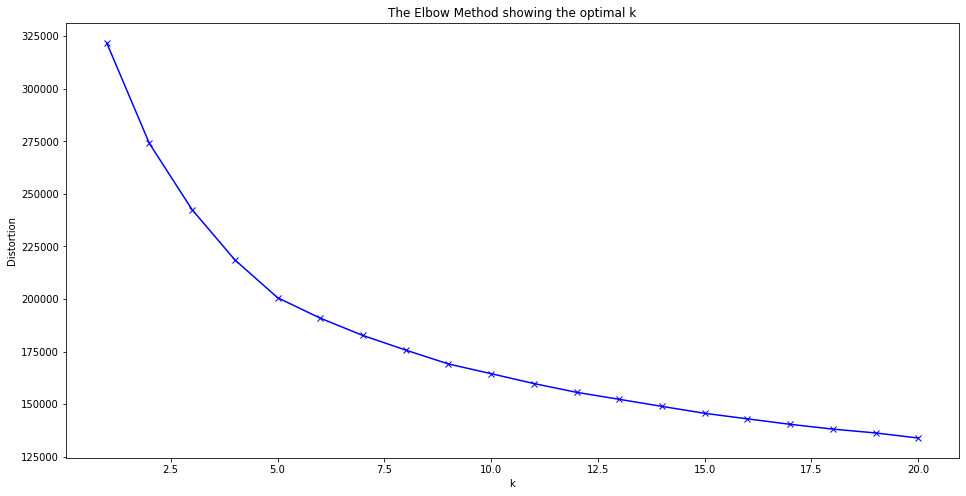

In [20]:
distortions = []
K = [v for v in range(1,21)]
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(data)
    distortions.append(kmeanModel.inertia_)
    
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()
x = np.array(data)

#### Se entrena el modelo

In [21]:
kmeans = KMeans(n_clusters = 5)
pred_y = kmeans.fit_predict(data)

{0: 786, 1: 9243, 2: 8988, 3: 9513, 4: 724}


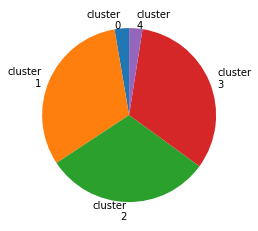

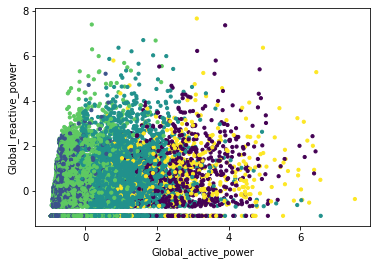

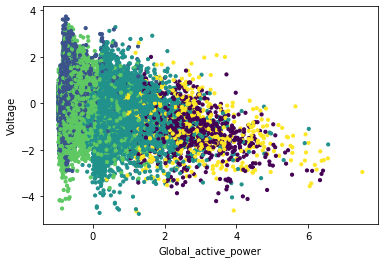

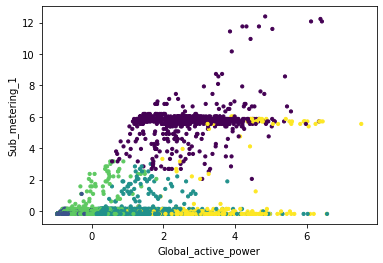

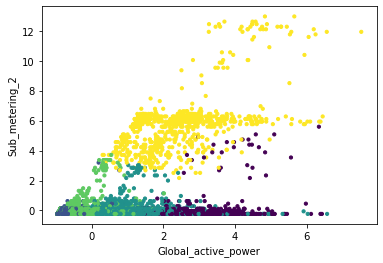

...

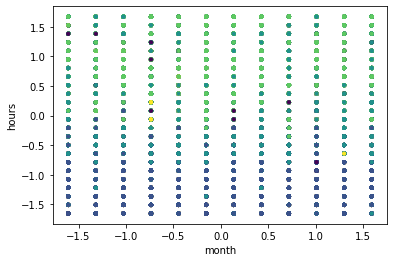

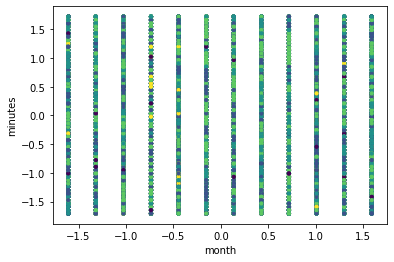

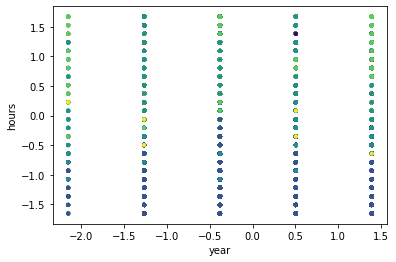

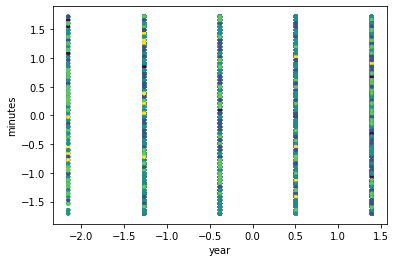

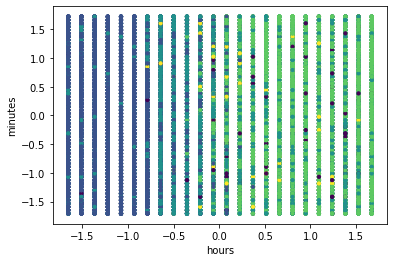

In [22]:
draw_prediction_distribution(pred_y)
view_assignments(pred_y)

# Hierarchical

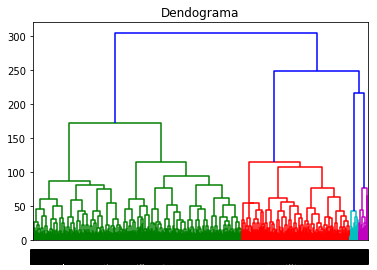

In [23]:
#Creamos el dendrograma para visualizar los agrupamientos y elegir la cantidad de clusters a utilizar
dendrogram = sch.dendrogram(sch.linkage(data, method = 'ward'))
plt.title('Dendograma')
plt.show()

#### Se entrena el modelo

In [24]:
hc = AgglomerativeClustering(n_clusters = 5)
y_hc = hc.fit_predict(data)

{0: 9491, 1: 7852, 2: 10380, 3: 716, 4: 815}


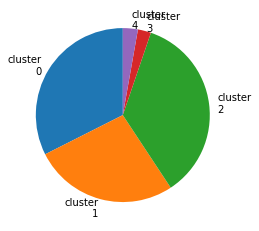

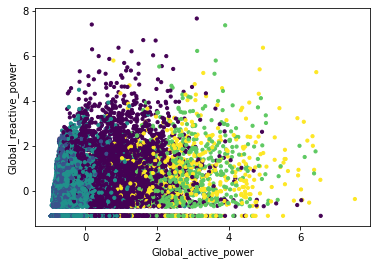

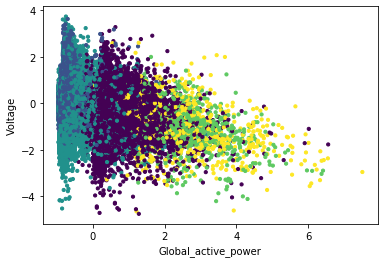

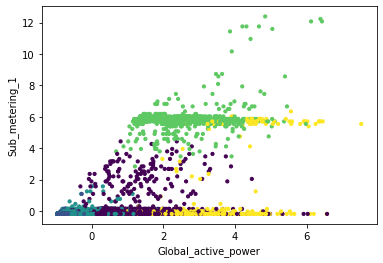

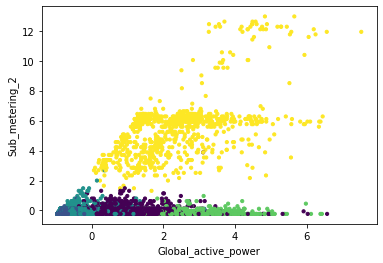

...

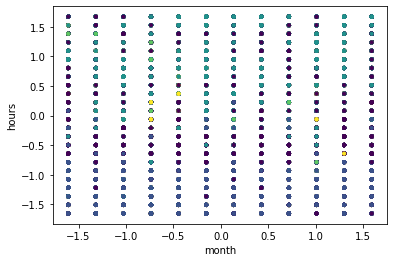

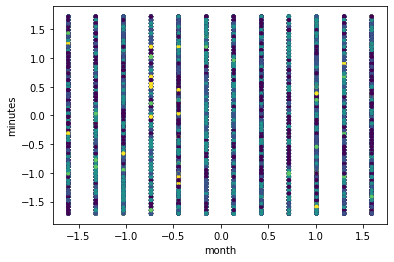

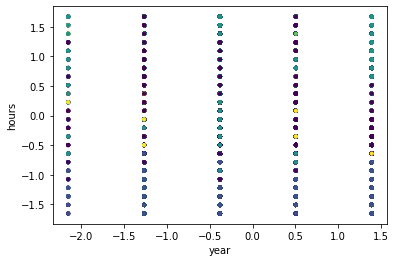

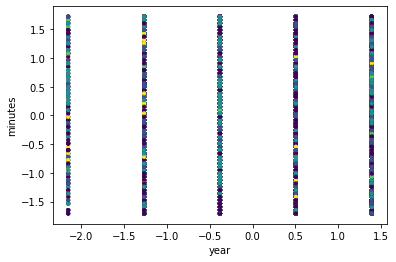

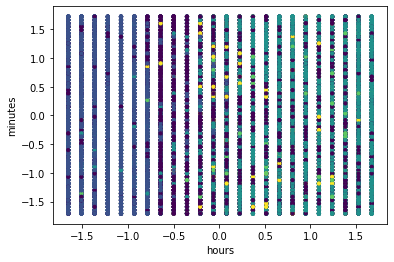

In [25]:
draw_prediction_distribution(y_hc)
view_assignments(y_hc)

# DBSCAN

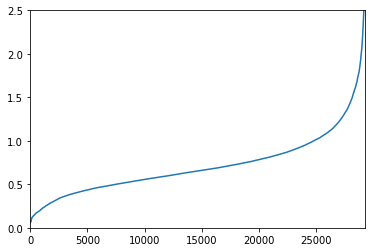

In [26]:
#Se calcula el n-esimo vecino mas cercano de todos los puntos, se ordenan de manera ascendente para
#realizar la gráfica y encontrar el punto de mayor curvatura
#donde se encontrará el valor óptimo para eps

neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(data)
distances, indices = nbrs.kneighbors(data)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.ylim(0,2.5)
plt.xlim(0,29259)
plt.plot(distances)

### Se entrena el modelo

{0: 16651, 1: 5343}


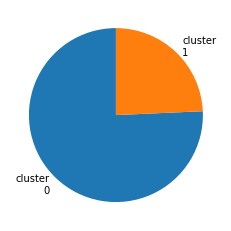

In [27]:
best = (1.25,27)
dbscan = DBSCAN(eps=best[0], min_samples = best[1],n_jobs = -1)
dbscan.fit_predict(data)
clusters = dbscan.labels_
draw_prediction_distribution(clusters)


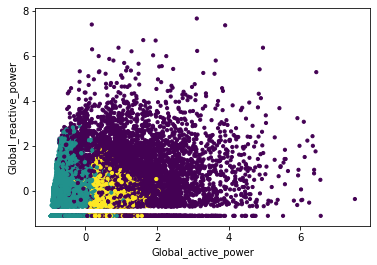

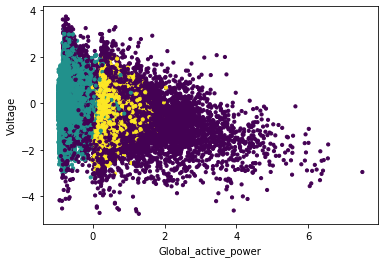

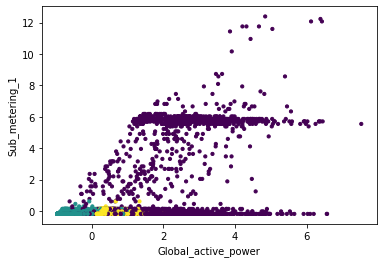

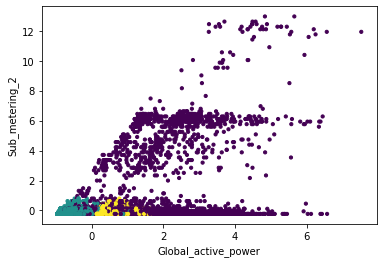

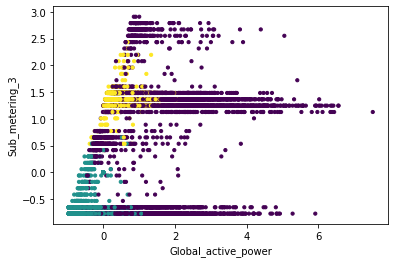

...

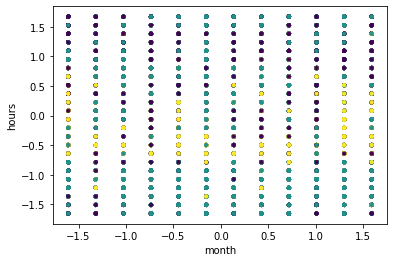

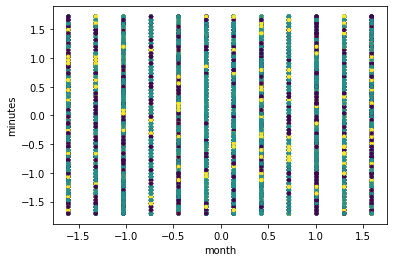

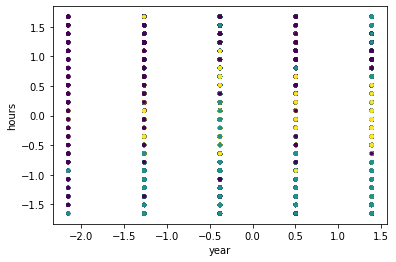

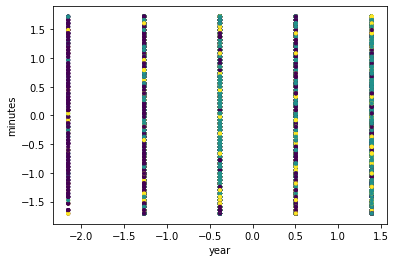

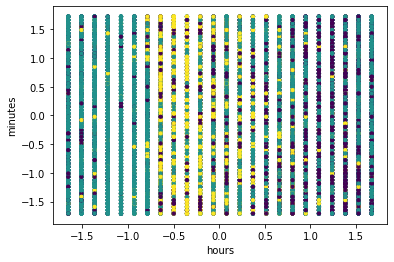

In [28]:

view_assignments(clusters)

## Métricas de evaluación

#### K-means

In [29]:
final = {}
labels = kmeans.labels_
silhouette_score = metrics.silhouette_score(data, labels, metric='euclidean')
calinski_harabasz_score = metrics.calinski_harabasz_score(data, labels)
print("|---Metrica---|----------Score------------|")
print("  Silhouette      ",silhouette_score)
print("  Calinski        ",calinski_harabasz_score)
final['kmeans'] = (silhouette_score,calinski_harabasz_score)

|---Metrica---|----------Score------------|
  Silhouette       0.14380905315694206
  Calinski         4418.359618976437


#### Hierarchical

In [30]:
labels = y_hc
silhouette_score = metrics.silhouette_score(data, labels, metric='euclidean')
calinski_harabasz_score = metrics.calinski_harabasz_score(data, labels)
print("|---Metrica---|----------Score------------|")
print("  Silhouette      ",silhouette_score)
print("  Calinski        ",calinski_harabasz_score)
final['Jerarquico'] = (silhouette_score,calinski_harabasz_score)

|---Metrica---|----------Score------------|
  Silhouette       0.12123643810097862
  Calinski         4098.419026886032


#### DBSCAN

In [31]:
labels = clusters
silhouette_score = metrics.silhouette_score(data, labels, metric='euclidean')
calinski_harabasz_score = metrics.calinski_harabasz_score(data, labels)
print("|---Metrica---|----------Score------------|")
print("  Silhouette      ",silhouette_score)
print("  Calinski        ",calinski_harabasz_score)
final['DBSCAN'] = (silhouette_score,calinski_harabasz_score)

|---Metrica---|----------Score------------|
  Silhouette       0.087363201790564
  Calinski         2860.587700861023


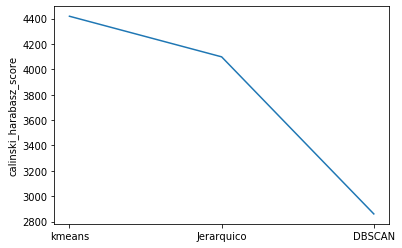

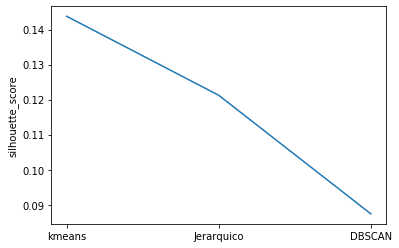

In [32]:
plt.plot([key for key in final],[final[key][1] for key in final])
plt.ylabel("calinski_harabasz_score")
plt.show()

plt.plot([key for key in final],[final[key][0] for key in final])
plt.ylabel("silhouette_score")
plt.show()

### Conclusiones

Entender los resultados obtenidos por los modelos no supervisados es en verdad algo retador, sin embargo, durante la elaboración de este taller se lograron entender muchos conceptos que permitieron en su momento estimar los mejores parámetros para cada modelo y además en la documentación de scikit-learn se pudieron encontrar dos scores que son realmente útiles para evaluar los resultados obtenidos cuando no tenemos los valores de verdad de las agrupaciones (los resultados verídicos). Gracias a estos scores es posible decir que el modelo más recomendable para utilizar en este conjunto de datos es  k-means, pues en ambas métricas el score obtenido por este modelo es superior al de los demás, y como se puede observar en las gráficas, aunque el jerárquico también se comporta bien, k-means lo hace mucho mejor. También podemos afirmar que el modelo que definitivamente no deberíamos usar en este caso es DBSCAN, pues sus agrupaciones son realmente pobres y de hecho las de menor desempeño entre los tres modelos. Estos scores lo que nos indican es lo bien formadas que están las agrupaciones de cada cluster,y por lo tanto la clara y objetiva segmentación que estos logran hacer sobre el conjunto de datos, es pertinente entonces concluir que de los tres modelos desarrollados Kmeans es el que mejor logra conglomerar los datos para este problema en particular. 